# Prepare environment

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib_venn import venn3, venn2
import seaborn as sns
import scanpy as sc
import glob

import sys

sys.path.append("./../../../../utilities_folder/")

from utilities import intTable

Set R environment with rpy2:

In [2]:
import rpy2.rinterface_lib.callbacks
import anndata2ri
import logging

from rpy2.robjects import pandas2ri
import rpy2.robjects as ro
from scipy import stats

rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

pandas2ri.activate()
anndata2ri.activate()

%load_ext rpy2.ipython

Set up parameters for Python plots:

In [3]:
%matplotlib inline
sc.set_figure_params(dpi = 600, fontsize = 20)

plt.rcParams['pdf.fonttype'] = 'truetype'

cmap_up = sns.light_palette("red", as_cmap=True)
cmap_down = sns.light_palette("blue", as_cmap=True)
cmap_all = sns.light_palette("seagreen", as_cmap=True)

Set folder paths

In [4]:
tables_folder = './tables/'

# Compare DEGs

In [5]:
egVSipsc = pd.read_excel(tables_folder + 'Bulk_hEGCLCs_vs_hiPSC_filtered.xlsx', index_col = 0)
egVSpgc = pd.read_excel(tables_folder + 'Bulk_hPGCLCs_vs_EGCLC_filtered.xlsx', index_col = 0)
ipscVSpgc = pd.read_excel(tables_folder + 'Bulk_hPGCLCs_vs_hiPSC_filtered.xlsx', index_col = 0)

In [6]:
up_eg_vs_ipsc = egVSipsc[egVSipsc.logFC > 0].index.tolist()
len(up_eg_vs_ipsc)

82

In [7]:
down_eg_vs_ipsc = egVSipsc[egVSipsc.logFC < 0].index.tolist()
len(down_eg_vs_ipsc)

34

In [8]:
egVSpgc

,logFC,logCPM,LR,PValue,FDR,Gene,-log10(FDR)
IGF1,15.896291,6.846814,2094.605002,0.000000,1.671936e-316,IGF1,315.776780
SOX17,13.895054,8.632823,2928.672152,0.000000,1.671936e-316,SOX17,315.776780
CHI3L2,13.443653,6.417250,2160.317252,0.000000,1.671936e-316,CHI3L2,315.776780
IRX6,12.703410,6.493450,2260.318922,0.000000,1.671936e-316,IRX6,315.776780
NANOS3,12.560026,8.623343,1951.820313,0.000000,1.671936e-316,NANOS3,315.776780
...,...,...,...,...,...,...,...
ATP4A,-2.398388,-0.822223,8.925405,0.002812,4.787297e-03,ATP4A,2.319910
KCNE2,-2.142631,-0.700751,8.582153,0.003395,5.709500e-03,KCNE2,2.243402
PPP1R36,-2.143626,0.183762,8.424237,0.003703,6.191570e-03,PPP1R36,2.208199
BDKRB2,-2.144906,-0.085745,8.318019,0.003925,6.543553e-03,BDKRB2,2.184186


In [9]:
up_pgc_vs_eg = egVSpgc[egVSpgc.logFC > 0].index.tolist()
down_pgc_vs_eg = egVSpgc[egVSpgc.logFC < 0].index.tolist()

len(up_pgc_vs_eg)

1024

In [10]:
len(down_pgc_vs_eg)

1639

In [11]:
ipscVSpgc

,logFC,logCPM,LR,PValue,FDR,Gene,-log10(FDR)
SOX17,17.549030,8.894461,2025.498153,0.000000,5.866289e-316,SOX17,315.231637
IGF1,15.801469,7.113052,1664.385070,0.000000,5.866289e-316,IGF1,315.231637
IRX6,15.460311,6.758986,1915.660894,0.000000,5.866289e-316,IRX6,315.231637
WNT2,15.321818,6.614517,2056.095895,0.000000,5.866289e-316,WNT2,315.231637
CHI3L2,12.600977,6.683063,1781.461462,0.000000,5.866289e-316,CHI3L2,315.231637
...,...,...,...,...,...,...,...
LRRC73,-2.415578,-0.129566,11.514055,0.000691,1.260929e-03,LRRC73,2.899309
CAPS2,-2.001239,-0.344132,11.222459,0.000808,1.464992e-03,CAPS2,2.834165
ERBB4,-2.021953,-0.359235,10.757452,0.001039,1.856177e-03,ERBB4,2.731381
OR14K1,-2.033268,-0.115466,9.782277,0.001762,3.062090e-03,OR14K1,2.513982


In [12]:
up_pgc_vs_ipsc = ipscVSpgc[ipscVSpgc.logFC > 0].index.tolist()
down_pgc_vs_ipsc = ipscVSpgc[ipscVSpgc.logFC < 0].index.tolist()

len(up_pgc_vs_ipsc)

953

In [13]:
len(down_pgc_vs_ipsc)

1632

# Venn diagrams
## All 

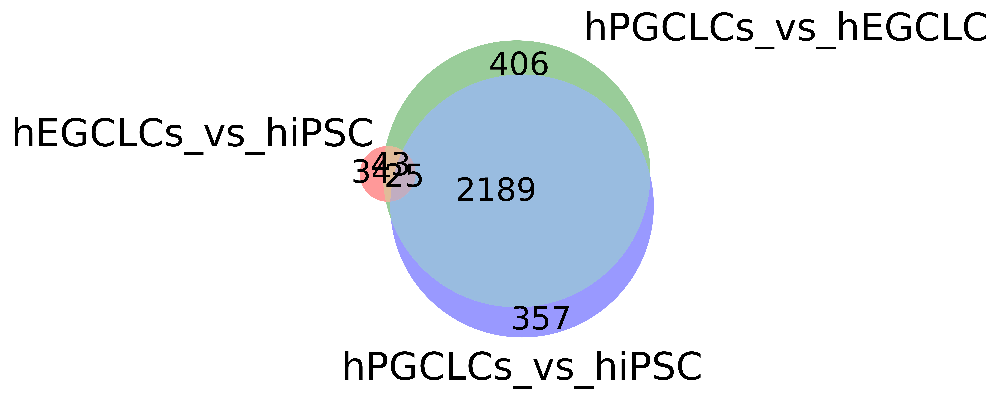

In [14]:
_ = venn3([set(egVSipsc.index), set(egVSpgc.index), set(ipscVSpgc.index)], set_labels=('hEGCLCs_vs_hiPSC', 'hPGCLCs_vs_hEGCLC', 'hPGCLCs_vs_hiPSC'))

## All positive

Let's put all together:
- up in PGC vs EGCLC
- up in PGC vs iPSC
- up in EG vs iPSC

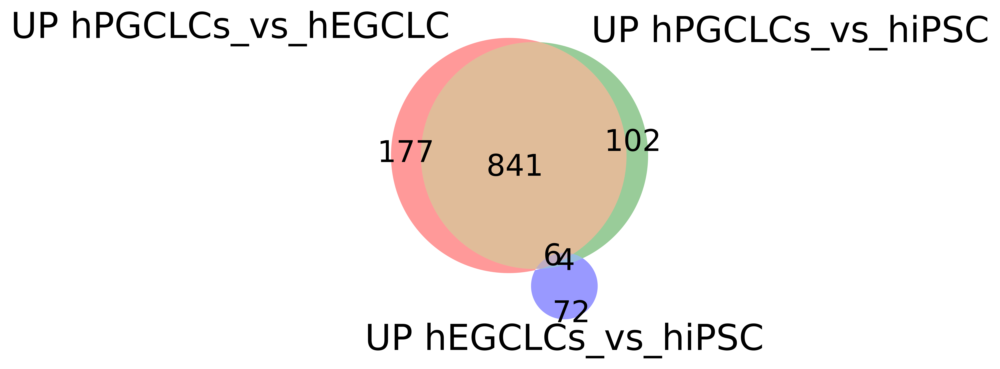

In [15]:
_ = venn3([set(up_pgc_vs_eg), set(up_pgc_vs_ipsc), set(up_eg_vs_ipsc)], set_labels=('UP hPGCLCs_vs_hEGCLC', 'UP hPGCLCs_vs_hiPSC', 'UP hEGCLCs_vs_hiPSC') )

## All negative

Let's put all together:
- down in PGC vs EGCLC
- down in PGC vs iPSC
- down in EG vs iPSC

In [16]:
_ = venn3([set(down_pgc_vs_eg), set(down_pgc_vs_ipsc), set(down_eg_vs_ipsc)], set_labels=('DOWN hPGCLCs_vs_hEGCLC', 'DOWN hPGCLCs_vs_hiPSC', 'DOWN hEGCLCs_vs_hiPSC') )

## Pairwise comparisons

### Up in PGC vs EGCLC and up in PGC vs iPSC

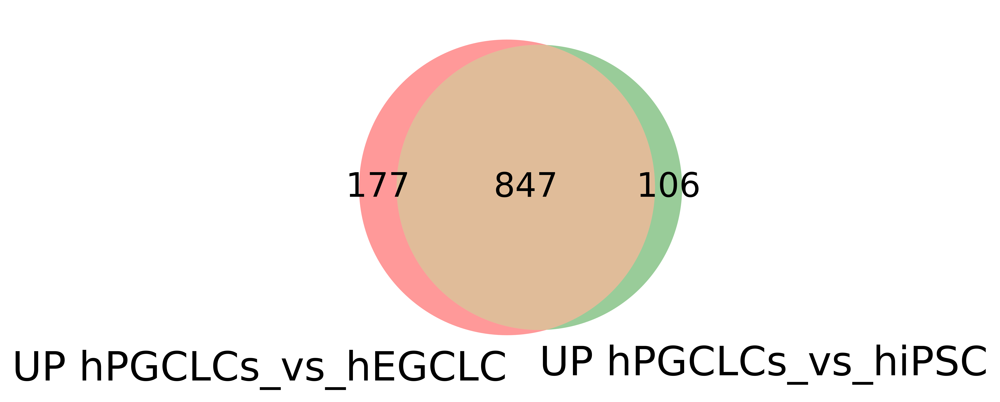

In [17]:
venn2([set(up_pgc_vs_eg), set(up_pgc_vs_ipsc)], set_labels=('UP hPGCLCs_vs_hEGCLC', 'UP hPGCLCs_vs_hiPSC') )

### Up in PGC vs EGCLC and up in EG vs iPSC

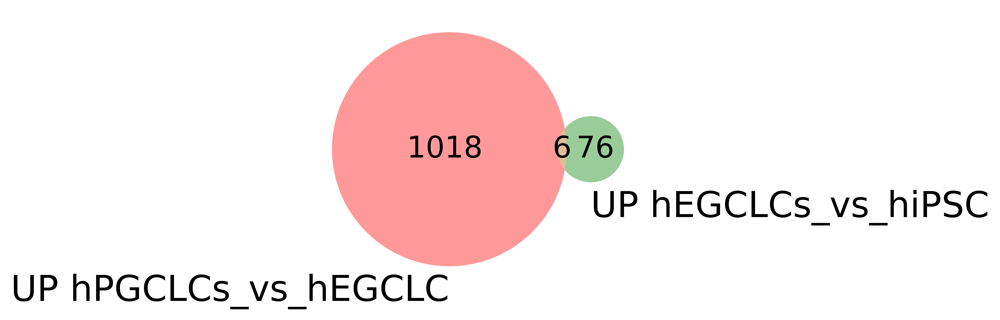

In [18]:
venn2([set(up_pgc_vs_eg), set(up_eg_vs_ipsc)], set_labels=('UP hPGCLCs_vs_hEGCLC', 'UP hEGCLCs_vs_hiPSC') )

### Up in PGC vs iPSC and up in EG vs iPSC

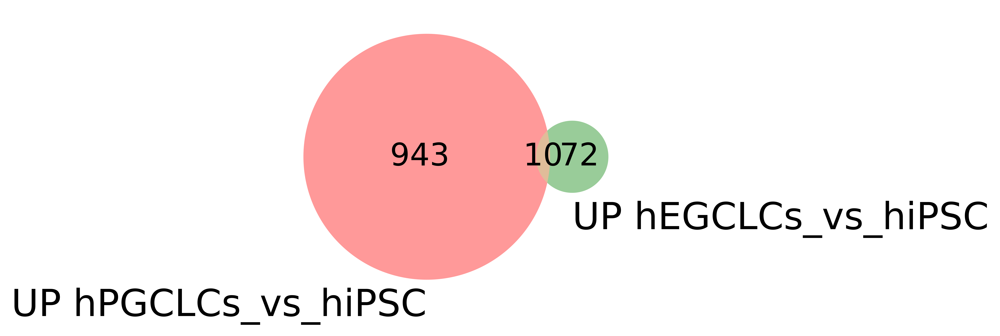

In [19]:
venn2([set(up_pgc_vs_ipsc), set(up_eg_vs_ipsc)], set_labels=('UP hPGCLCs_vs_hiPSC', 'UP hEGCLCs_vs_hiPSC') )

### Up in EG vs iPSC and up in EG vs PGC

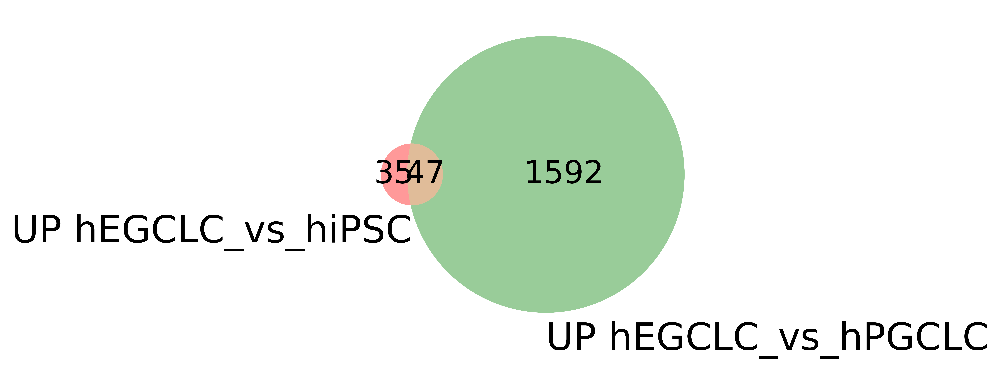

In [20]:
venn2([set(up_eg_vs_ipsc), set(down_pgc_vs_eg)], set_labels=('UP hEGCLC_vs_hiPSC', 'UP hEGCLC_vs_hPGCLC') )

### Up in EG vs iPSC and up in iPSC vs PGC

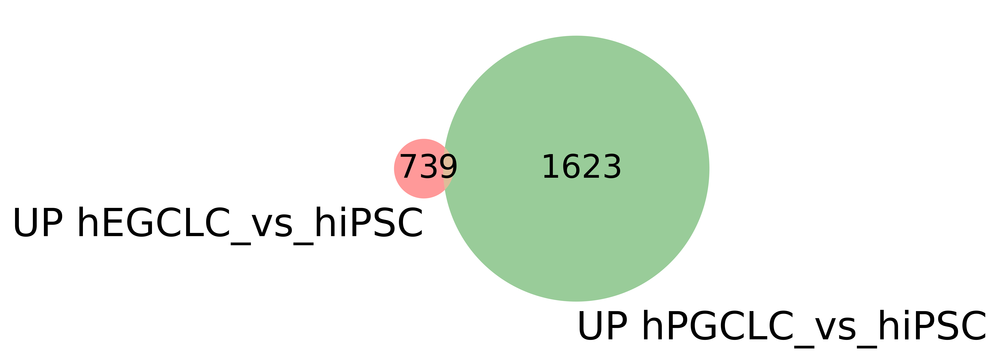

In [21]:
venn2([set(up_eg_vs_ipsc), set(down_pgc_vs_ipsc)], set_labels=('UP hEGCLC_vs_hiPSC', 'UP hPGCLC_vs_hiPSC') )

### Up in iPSC vs EG and up in PGC vs EG

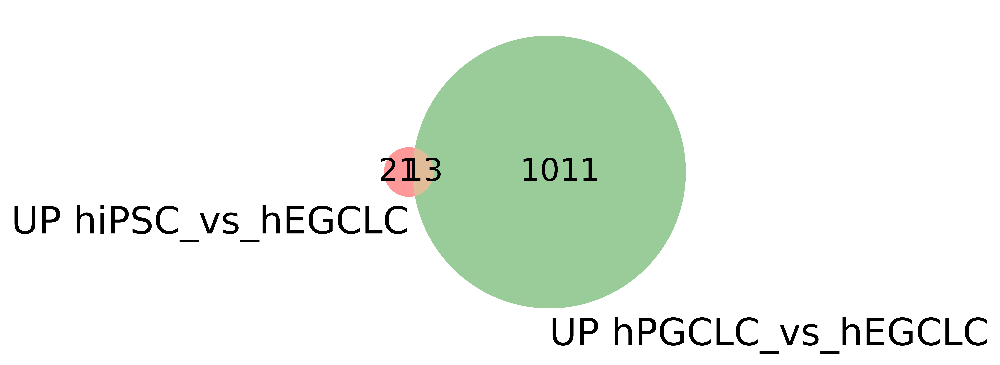

In [22]:
venn2([set(down_eg_vs_ipsc), set(up_pgc_vs_eg)], set_labels=('UP hiPSC_vs_hEGCLC', 'UP hPGCLC_vs_hEGCLC') )

### Up in iPSC vs EG and up in EG vs PGC

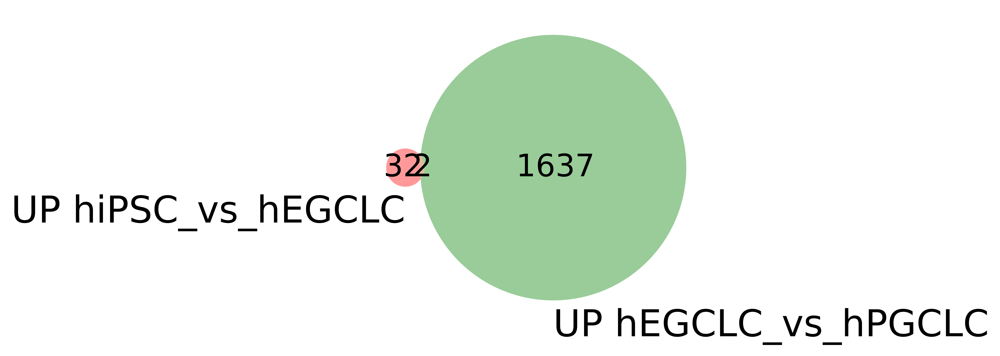

In [23]:
venn2([set(down_eg_vs_ipsc), set(down_pgc_vs_eg)], set_labels=('UP hiPSC_vs_hEGCLC', 'UP hEGCLC_vs_hPGCLC') )

### Up in iPSC vs EG and up in PGC vs iPSC

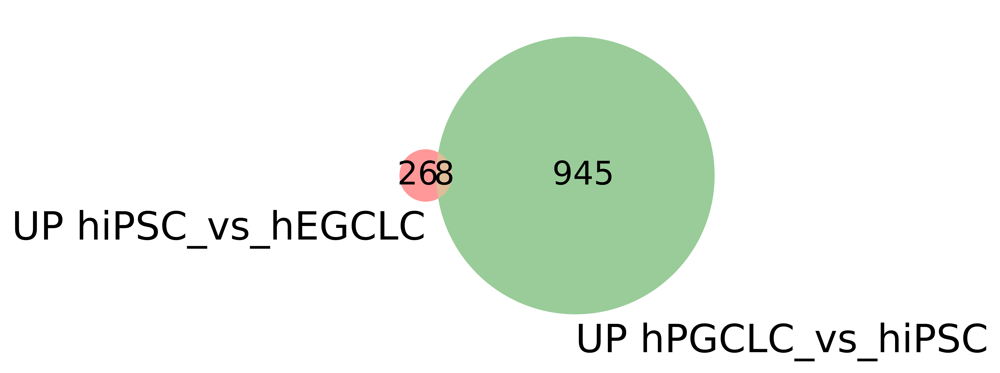

In [24]:
venn2([set(down_eg_vs_ipsc), set(up_pgc_vs_ipsc)], set_labels=('UP hiPSC_vs_hEGCLC', 'UP hPGCLC_vs_hiPSC') )

### Up in iPSC vs EG and up in iPSC vs PGC

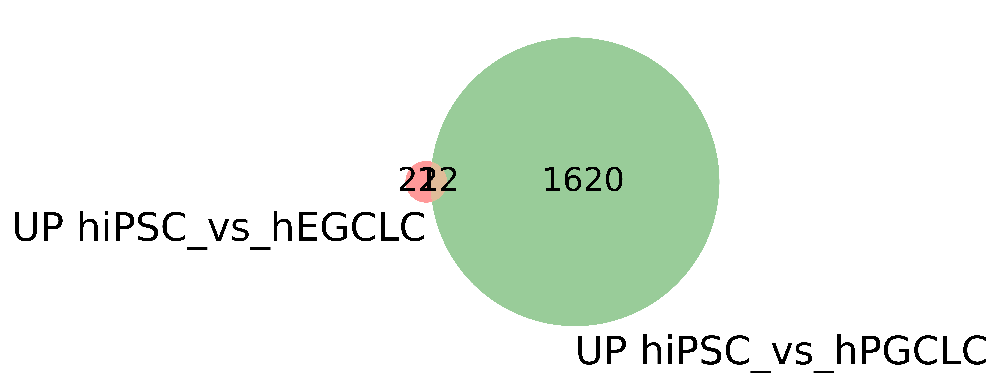

In [25]:
venn2([set(down_eg_vs_ipsc), set(down_pgc_vs_ipsc)], set_labels=('UP hiPSC_vs_hEGCLC', 'UP hiPSC_vs_hPGCLC') )

### Up in PGC vs EG and up in iPSC vs PGC

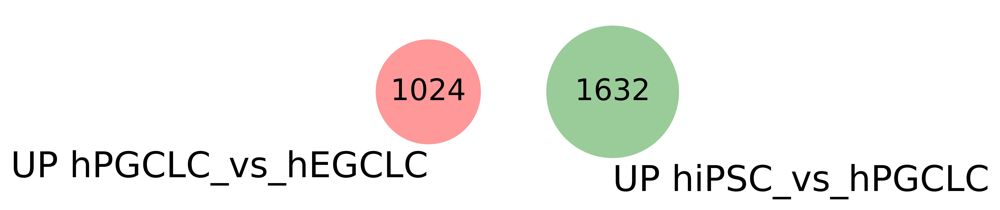

In [26]:
venn2([set(up_pgc_vs_eg), set(down_pgc_vs_ipsc)], set_labels=('UP hPGCLC_vs_hEGCLC', 'UP hiPSC_vs_hPGCLC') )

### Up in EG vs PGC and up in PGC vs iPSC

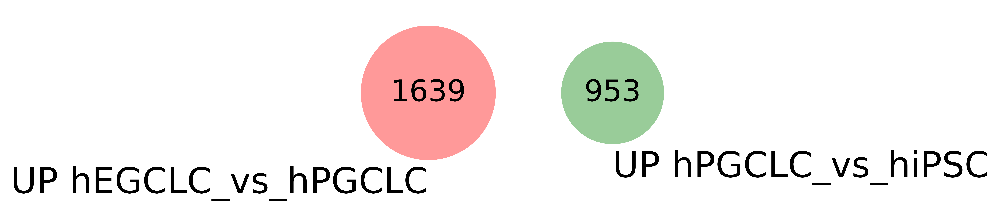

In [27]:
venn2([set(down_pgc_vs_eg), set(up_pgc_vs_ipsc)], set_labels=('UP hEGCLC_vs_hPGCLC', 'UP hPGCLC_vs_hiPSC') )

### Up in EG vs PGC and up in iPSC vs PGC

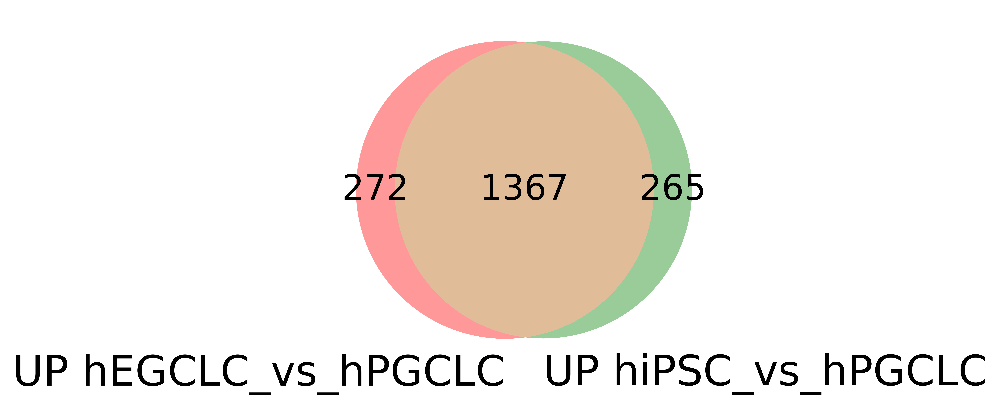

In [28]:
venn2([set(down_pgc_vs_eg), set(down_pgc_vs_ipsc)], set_labels=('UP hEGCLC_vs_hPGCLC', 'UP hiPSC_vs_hPGCLC') )

# Statistical overlaps

In [29]:
%%R -i up_eg_vs_ipsc -i down_eg_vs_ipsc -i up_pgc_vs_eg -i down_pgc_vs_eg -i up_pgc_vs_ipsc -i down_pgc_vs_ipsc

loc <- './../../../../R_loc' # pointing to the renv environment

.libPaths(loc)

library(GeneOverlap) 

up <- list(up_eg_vs_ipsc, up_pgc_vs_eg, up_pgc_vs_ipsc)
names(up) <- c('up_eg_vs_ipsc', 'up_pgc_vs_eg', 'up_pgc_vs_ipsc')

down <- list(down_eg_vs_ipsc, down_pgc_vs_eg, down_pgc_vs_ipsc)
names(down) <- c('down_eg_vs_ipsc', 'down_pgc_vs_eg', 'down_pgc_vs_ipsc')

gom.obj_up_down <- newGOM(up, down, genome.size = 14582)
gom.obj_up_up <- newGOM(up, genome.size = 14582)
gom.obj_down_down <- newGOM(down, genome.size = 14582)

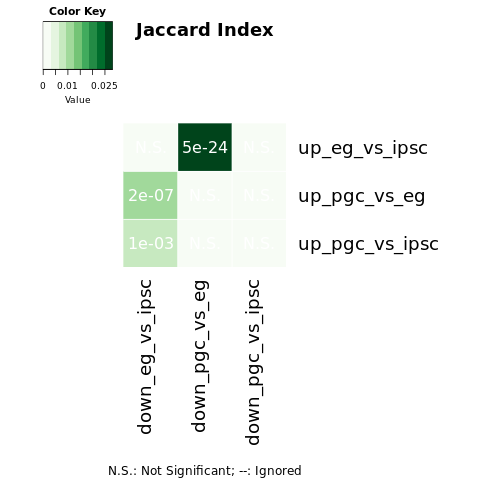

In [30]:
%%R
drawHeatmap(gom.obj_up_down, what = 'Jaccard', grid.col="Greens", note.col="white")

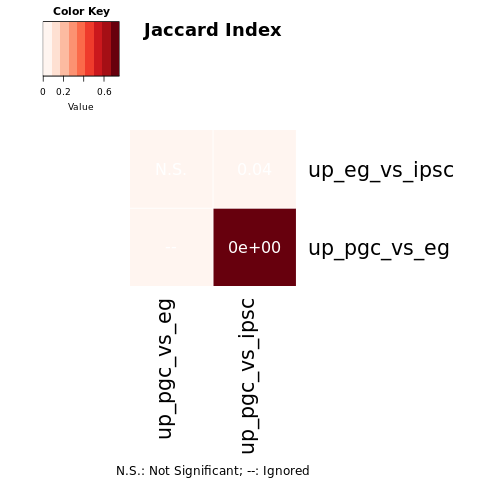

In [31]:
%%R
drawHeatmap(gom.obj_up_up, what = 'Jaccard', grid.col="Reds", note.col="white")

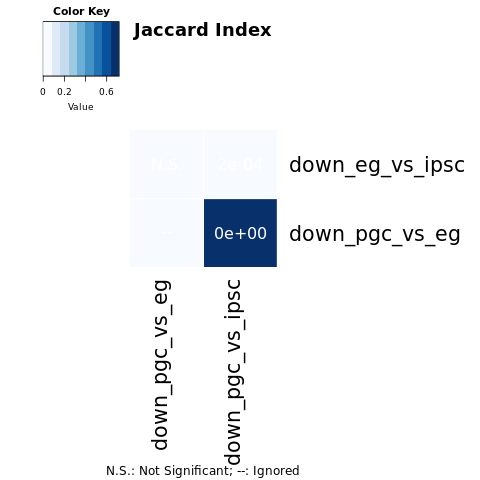

In [32]:
%%R
drawHeatmap(gom.obj_down_down, what = 'Jaccard', grid.col="Blues",  note.col="white")

# Jaccard index - precise numbers

In [33]:
l1 = list(set(egVSipsc.index))
l1.sort()

l2 = list(set(egVSpgc.index))
l2.sort()

l3 = list(set(ipscVSpgc.index))
l3.sort()


upsetplot_df = pd.DataFrame([l1,l2,l3]).T
upsetplot_df.columns = ['hEGCLCs_vs_hiPSC', 'hPGCLCs_vs_hEGCLC', 'hPGCLCs_vs_hiPSC']

In [34]:
stats_pos = {}

for i, n in zip([l1,l2,l3], upsetplot_df.columns):
    for j, m in zip([l1,l2,l3], upsetplot_df.columns):
        key = n + '-' + m
        set1 = set(i)
        set2 = set(j)
        intersection = len(set1.intersection(set2))
        union = len(set1.union(set2))
        stats_pos[key] = intersection/union

In [35]:
stats_pos

{'hEGCLCs_vs_hiPSC-hEGCLCs_vs_hiPSC': 1.0,
 'hEGCLCs_vs_hiPSC-hPGCLCs_vs_hEGCLC': 0.025082995204721504,
 'hEGCLCs_vs_hiPSC-hPGCLCs_vs_hiPSC': 0.014650638617580767,
 'hPGCLCs_vs_hEGCLC-hEGCLCs_vs_hiPSC': 0.025082995204721504,
 'hPGCLCs_vs_hEGCLC-hPGCLCs_vs_hEGCLC': 1.0,
 'hPGCLCs_vs_hEGCLC-hPGCLCs_vs_hiPSC': 0.7297297297297297,
 'hPGCLCs_vs_hiPSC-hEGCLCs_vs_hiPSC': 0.014650638617580767,
 'hPGCLCs_vs_hiPSC-hPGCLCs_vs_hEGCLC': 0.7297297297297297,
 'hPGCLCs_vs_hiPSC-hPGCLCs_vs_hiPSC': 1.0}

In [36]:
df_to_plot = pd.DataFrame(stats_pos.values(), index = stats_pos.keys())
i1 = pd.Series(df_to_plot.index).apply(lambda x: x.split('-')[0])
i2 = pd.Series(df_to_plot.index).apply(lambda x: x.split('-')[1])
df_to_plot = df_to_plot.reset_index()
df_to_plot['i1'] = i1
df_to_plot['i2'] = i2
df_to_plot = df_to_plot.pivot(index='i1', columns='i2', values=0)

In [37]:
plt.figure(figsize = (5, 5))
mask = np.triu(np.ones_like(df_to_plot, dtype=bool))
sns.heatmap(df_to_plot, mask=mask,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, cmap = 'PuBu')

<AxesSubplot:xlabel='i2', ylabel='i1'>

# Comparisons of GO term

## GO BP

In [38]:
egVSipsc_up = pd.read_excel(tables_folder + 'GO_upregulated_hEGCLCs_vs_hiPSC_BP.xlsx', index_col = 0)
pgcVSeg_up = pd.read_excel(tables_folder + 'GO_upregulated_hPGCLCs_vs_EGCLC_BP.xlsx', index_col = 0)
pgcVSipsc_up = pd.read_excel(tables_folder + 'GO_upregulated_hPGCLCs_vs_hiPSC_BP.xlsx', index_col = 0)

In [39]:
egVSipsc_down = pd.read_excel(tables_folder + 'GO_downregulated_hEGCLCs_vs_hiPSC_BP.xlsx', index_col = 0)
pgcVSeg_down = pd.read_excel(tables_folder + 'GO_downregulated_hPGCLCs_vs_EGCLC_BP.xlsx', index_col = 0)
pgcVSipsc_down = pd.read_excel(tables_folder + 'GO_downregulated_hPGCLCs_vs_hiPSC_BP.xlsx', index_col = 0)

In [40]:
egVSipsc_all = pd.read_excel(tables_folder + 'GO_allSignificant_hEGCLCs_vs_hiPSC_BP.xlsx', index_col = 0)
pgcVSeg_all = pd.read_excel(tables_folder + 'GO_allSignificant_hPGCLCs_vs_EGCLC_BP.xlsx', index_col = 0)
pgcVSipsc_all = pd.read_excel(tables_folder + 'GO_allSignificant_hPGCLCs_vs_hiPSC_BP.xlsx', index_col = 0)

In [41]:
len(egVSipsc_up)

15

In [42]:
len(pgcVSeg_up)

159

In [43]:
len(pgcVSipsc_up)

128

# Venn diagrams
## Terms enriched in upregulated genes 

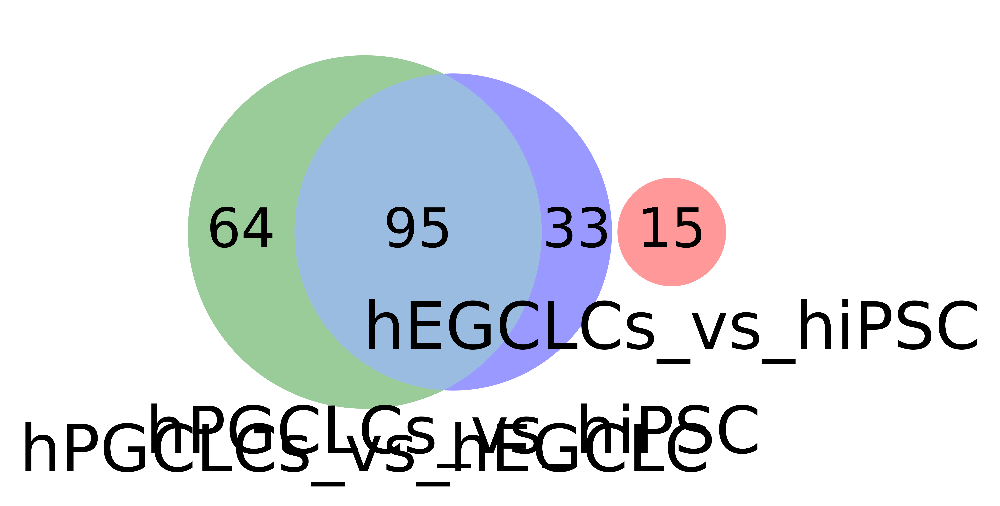

In [44]:
_ = venn3([set(egVSipsc_up['GO.ID']), set(pgcVSeg_up['GO.ID']), set(pgcVSipsc_up['GO.ID'])], set_labels=('hEGCLCs_vs_hiPSC', 'hPGCLCs_vs_hEGCLC', 'hPGCLCs_vs_hiPSC'))

In [45]:
pgcVSeg_up

,GO.ID,Term,Annotated,Significant,Expected,Statistics,ER,-log10(pvalue),Significant/Annotated
1,GO:0045165,cell fate commitment,170,46,12.49,8.400000e-08,3.68,7.075721,0.270588
2,GO:0001709,cell fate determination,22,10,1.62,1.200000e-06,6.17,5.920819,0.454545
3,GO:0003161,cardiac conduction system development,27,11,1.98,1.400000e-06,5.56,5.853872,0.407407
4,GO:0060070,canonical Wnt signaling pathway,258,39,18.95,3.700000e-06,2.06,5.431798,0.151163
5,GO:0007422,peripheral nervous system development,68,16,4.99,3.900000e-06,3.21,5.408935,0.235294
...,...,...,...,...,...,...,...,...,...
155,GO:0019369,arachidonic acid metabolic process,33,7,2.42,8.900000e-03,2.89,2.050610,0.212121
156,GO:0001947,heart looping,50,9,3.67,9.750000e-03,2.45,2.010995,0.180000
157,GO:0055007,cardiac muscle cell differentiation,82,13,6.02,9.800000e-03,2.16,2.008774,0.158537
158,GO:0031954,positive regulation of protein autophosp...,26,6,1.91,9.950000e-03,3.14,2.002177,0.230769


In [46]:
intersection = set(pgcVSeg_up['Term']).intersection(set(pgcVSipsc_up['Term']))
df = pd.DataFrame(index = intersection)
pgcVSeg_up.index = pgcVSeg_up.Term
pgcVSipsc_up.index = pgcVSipsc_up.Term
df['Scores_pgcVSeg_up'] = pgcVSeg_up[pgcVSeg_up.Term.isin(intersection)]['Statistics']
df['Scores_pgcVSipsc_up'] = pgcVSipsc_up[pgcVSipsc_up.Term.isin(intersection)]['Statistics']
df['Combined'] = df['Scores_pgcVSeg_up'] * df['Scores_pgcVSipsc_up']

In [47]:
intTable(df.sort_values(by = 'Combined'), save = False)

Column
    [0] Tabulator(page_size=10, pagination='remote', value=              ...)

In [48]:
set(egVSipsc_up['Term']).intersection(set(pgcVSipsc_up['Term']))

set()

In [49]:
set(egVSipsc_up['Term'])

{'DNA methylation',
 'aging',
 'aromatic compound catabolic process',
 'cellular process involved in reproductio...',
 'gene silencing by RNA',
 'germ cell development',
 'learning or memory',
 'locomotory behavior',
 'methylation',
 'negative regulation of phosphorylation',
 'negative regulation of protein-containin...',
 'organic cyclic compound catabolic proces...',
 'piRNA metabolic process',
 'response to oxidative stress',
 'spermatogenesis'}

## Terms enriched in downregulated genes 

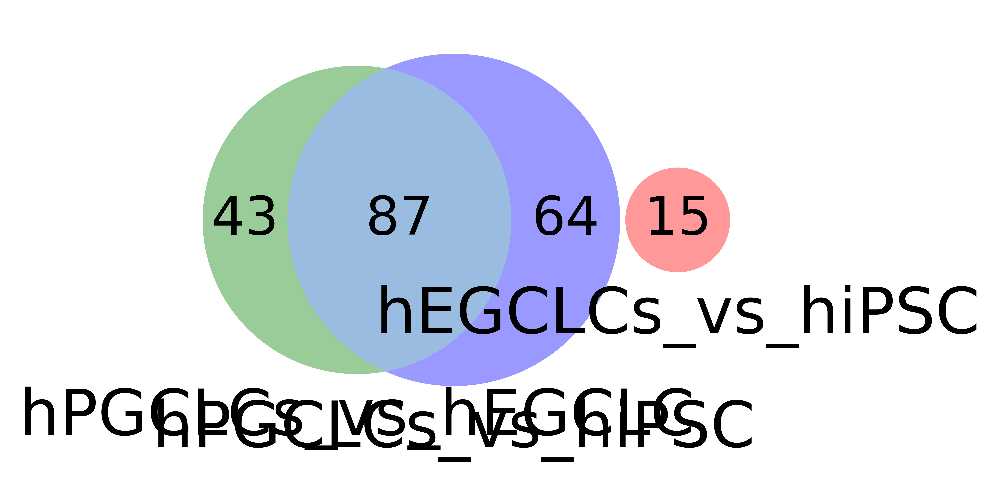

In [50]:
_ = venn3([set(egVSipsc_down['GO.ID']), set(pgcVSeg_down['GO.ID']), set(pgcVSipsc_down['GO.ID'])], set_labels=('hEGCLCs_vs_hiPSC', 'hPGCLCs_vs_hEGCLC', 'hPGCLCs_vs_hiPSC'))

In [51]:
set(pgcVSeg_down['Term']).intersection(set(pgcVSipsc_down['Term'])).intersection(set(egVSipsc_down['Term']))

set()

In [52]:
set(pgcVSeg_down['Term']).intersection(set(pgcVSipsc_down['Term']))

{'B cell receptor signaling pathway',
 'G protein-coupled receptor signaling pat...',
 'activation of transmembrane receptor pro...',
 'adenylate cyclase-activating G protein-c...',
 'adult locomotory behavior',
 'antimicrobial humoral immune response me...',
 'behavioral fear response',
 'calcium ion transmembrane import into cy...',
 'calcium ion-regulated exocytosis of neur...',
 'cellular response to calcium ion',
 'cellular sodium ion homeostasis',
 'chemokine-mediated signaling pathway',
 'chloride transmembrane transport',
 'chondrocyte proliferation',
 'complement activation, classical pathway',
 'detection of temperature stimulus',
 'dopamine metabolic process',
 'engulfment of apoptotic cell',
 'excitatory postsynaptic potential',
 'exploration behavior',
 'eye photoreceptor cell development',
 'gamma-aminobutyric acid signaling pathwa...',
 'ionotropic glutamate receptor signaling ...',
 'locomotory behavior',
 'lymph vessel morphogenesis',
 'membrane depolarization',
 'memo

In [53]:
pgcVSeg_down= pgcVSeg_down[~pgcVSeg_down.index.duplicated()]
pgcVSipsc_down= pgcVSipsc_down[~pgcVSipsc_down.index.duplicated()]

In [54]:
intersection = set(pgcVSeg_down['Term']).intersection(set(pgcVSipsc_down['Term']))
df = pd.DataFrame(index = intersection)
#pgcVSeg_down.index = pgcVSeg_down.Term
#pgcVSipsc_down.index = pgcVSipsc_down.Term
df['Scores_pgcVSeg_up'] = pgcVSeg_down[pgcVSeg_down.Term.isin(intersection)]['Statistics']
df['Scores_pgcVSipsc_up'] = pgcVSipsc_down[pgcVSipsc_down.Term.isin(intersection)]['Statistics']
df['Combined'] = df['Scores_pgcVSeg_up'] * df['Scores_pgcVSipsc_up']

In [55]:
intTable(df.sort_values(by = 'Combined'), save = False)

Column
    [0] Tabulator(page_size=10, pagination='remote', value=                          ...)

In [56]:
set(egVSipsc_down['Term']).intersection(set(pgcVSipsc_down['Term']))

set()

In [57]:
intersection = set(egVSipsc_down['Term']).intersection(set(pgcVSipsc_down['Term']))
df = pd.DataFrame(index = intersection)
egVSipsc_down.index = egVSipsc_down.Term
pgcVSipsc_down.index = pgcVSipsc_down.Term
df['Scores_egVSipsc_down'] = egVSipsc_down[egVSipsc_down.Term.isin(intersection)]['Statistics']
df['Scores_pgcVSipsc_down'] = pgcVSipsc_down[pgcVSipsc_down.Term.isin(intersection)]['Statistics']
df['Combined'] = df['Scores_egVSipsc_down'] * df['Scores_pgcVSipsc_down']

In [58]:
intTable(df.sort_values(by = 'Combined'), save = False)

Column
    [0] Tabulator(page_size=10, pagination='remote', value=Empty DataFrame
Columns: [...)

## Terms enriched in all genes 

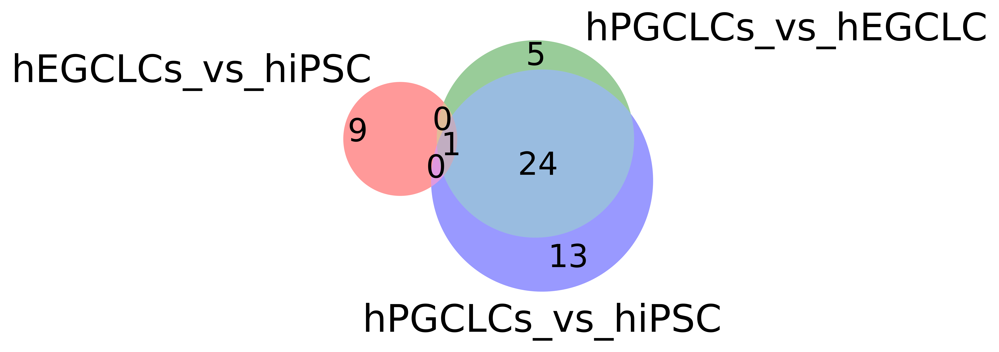

In [59]:
_ = venn3([set(egVSipsc_all['GO.ID']), set(pgcVSeg_all['GO.ID']), set(pgcVSipsc_all['GO.ID'])], set_labels=('hEGCLCs_vs_hiPSC', 'hPGCLCs_vs_hEGCLC', 'hPGCLCs_vs_hiPSC'))

In [60]:
set(pgcVSeg_all['Term']).intersection(set(pgcVSipsc_all['Term'])).intersection(set(egVSipsc_all['Term']))

{'postsynaptic membrane'}

In [61]:
set(pgcVSeg_all['Term']).intersection(set(pgcVSipsc_all['Term']))

{'AMPA glutamate receptor complex',
 'GABA-ergic synapse',
 'Golgi lumen',
 'anchored component of membrane',
 'anchored component of plasma membrane',
 'blood microparticle',
 'chloride channel complex',
 'collagen trimer',
 'dendrite membrane',
 'dense core granule',
 'excitatory synapse',
 'external side of plasma membrane',
 'extracellular matrix',
 'glial cell projection',
 'hippocampal mossy fiber to CA3 synapse',
 'integral component of postsynaptic densi...',
 'integral component of postsynaptic speci...',
 'integral component of presynaptic membra...',
 'intrinsic component of synaptic vesicle ...',
 'postsynaptic density membrane',
 'postsynaptic membrane',
 'receptor complex',
 'sodium channel complex',
 'terminal bouton',
 'voltage-gated potassium channel complex'}

In [62]:
set(egVSipsc_all['Term']).intersection(set(pgcVSipsc_all['Term']))

{'postsynaptic membrane'}

## GO MF

In [63]:
egVSipsc_up = pd.read_excel(tables_folder + 'GO_upregulated_hEGCLCs_vs_hiPSC_MF.xlsx', index_col = 0)
pgcVSeg_up = pd.read_excel(tables_folder + 'GO_upregulated_hPGCLCs_vs_EGCLC_MF.xlsx', index_col = 0)
pgcVSipsc_up = pd.read_excel(tables_folder + 'GO_upregulated_hPGCLCs_vs_hiPSC_MF.xlsx', index_col = 0)

In [64]:
egVSipsc_down = pd.read_excel(tables_folder + 'GO_downregulated_hEGCLCs_vs_hiPSC_MF.xlsx', index_col = 0)
pgcVSeg_down = pd.read_excel(tables_folder + 'GO_downregulated_hPGCLCs_vs_EGCLC_MF.xlsx', index_col = 0)
pgcVSipsc_down = pd.read_excel(tables_folder + 'GO_downregulated_hPGCLCs_vs_hiPSC_MF.xlsx', index_col = 0)

In [65]:
egVSipsc_all = pd.read_excel(tables_folder + 'GO_allSignificant_hEGCLCs_vs_hiPSC_MF.xlsx', index_col = 0)
pgcVSeg_all = pd.read_excel(tables_folder + 'GO_allSignificant_hPGCLCs_vs_EGCLC_MF.xlsx', index_col = 0)
pgcVSipsc_all = pd.read_excel(tables_folder + 'GO_allSignificant_hPGCLCs_vs_hiPSC_MF.xlsx', index_col = 0)

In [66]:
len(egVSipsc_up)

9

In [67]:
len(pgcVSeg_up)

22

In [68]:
len(pgcVSipsc_up)

19

# Venn diagrams
## Terms enriched in upregulated genes 

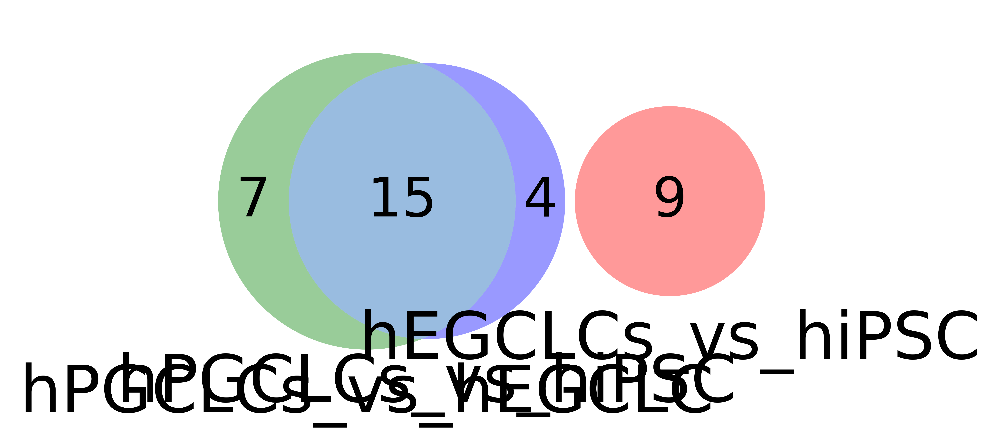

In [69]:
_ = venn3([set(egVSipsc_up['GO.ID']), set(pgcVSeg_up['GO.ID']), set(pgcVSipsc_up['GO.ID'])], set_labels=('hEGCLCs_vs_hiPSC', 'hPGCLCs_vs_hEGCLC', 'hPGCLCs_vs_hiPSC'))

In [70]:
pgcVSeg_up

,GO.ID,Term,Annotated,Significant,Expected,Statistics,ER,-log10(pvalue),Significant/Annotated
1,GO:0001228,DNA-binding transcription activator acti...,329,57,24.10,7.200000e-10,2.37,9.142668,0.173252
2,GO:0005109,frizzled binding,25,12,1.83,4.700000e-08,6.56,7.327902,0.480000
3,GO:0005125,cytokine activity,102,20,7.47,4.700000e-05,2.68,4.327902,0.196078
4,GO:0005201,extracellular matrix structural constitu...,123,24,9.01,5.400000e-05,2.66,4.267606,0.195122
5,GO:0070851,growth factor receptor binding,97,18,7.10,1.500000e-04,2.54,3.823909,0.185567
6,GO:0004896,cytokine receptor activity,50,12,3.66,2.000000e-04,3.28,3.698970,0.240000
7,GO:0019955,cytokine binding,89,20,6.52,4.100000e-04,3.07,3.387216,0.224719
8,GO:0008201,heparin binding,111,19,8.13,4.200000e-04,2.34,3.376751,0.171171
9,GO:0008528,G protein-coupled peptide receptor activ...,66,13,4.83,7.100000e-04,2.69,3.148742,0.196970
10,GO:0017046,peptide hormone binding,35,9,2.56,7.200000e-04,3.52,3.142668,0.257143


In [71]:
pgcVSeg_up[pgcVSeg_up.Term.isin(intersection)]

,GO.ID,Term,Annotated,Significant,Expected,Statistics,ER,-log10(pvalue),Significant/Annotated


In [72]:
len(pgcVSeg_up[pgcVSeg_up.Term.isin(intersection)])

0

In [73]:
len(intersection)

0

In [74]:
pgcVSipsc_up[pgcVSipsc_up.Term.isin(intersection)]

,GO.ID,Term,Annotated,Significant,Expected,Statistics,ER,-log10(pvalue),Significant/Annotated


In [75]:
intersection = set(pgcVSeg_up['Term']).intersection(set(pgcVSipsc_up['Term']))
df = pd.DataFrame(index = intersection)
pgcVSeg_up.index = pgcVSeg_up.Term
pgcVSipsc_up.index = pgcVSipsc_up.Term
df['Scores_pgcVSeg_up'] = pgcVSeg_up[pgcVSeg_up.Term.isin(intersection)]['Statistics']
df['Scores_pgcVSipsc_up'] = pgcVSipsc_up[pgcVSipsc_up.Term.isin(intersection)]['Statistics']
df['Combined'] = df['Scores_pgcVSeg_up'] * df['Scores_pgcVSipsc_up']

In [76]:
intTable(df.sort_values(by = 'Combined'), save = False)

Column
    [0] Tabulator(page_size=10, pagination='remote', value=              ...)

In [77]:
set(egVSipsc_up['Term']).intersection(set(pgcVSipsc_up['Term']))

set()

In [78]:
set(egVSipsc_up['Term'])

{'DNA-binding transcription repressor acti...',
 'active ion transmembrane transporter act...',
 'active transmembrane transporter activit...',
 'cation transmembrane transporter activit...',
 'inorganic cation transmembrane transport...',
 'mRNA binding',
 'phosphoric ester hydrolase activity',
 'structural molecule activity'}

## Terms enriched in downregulated genes 

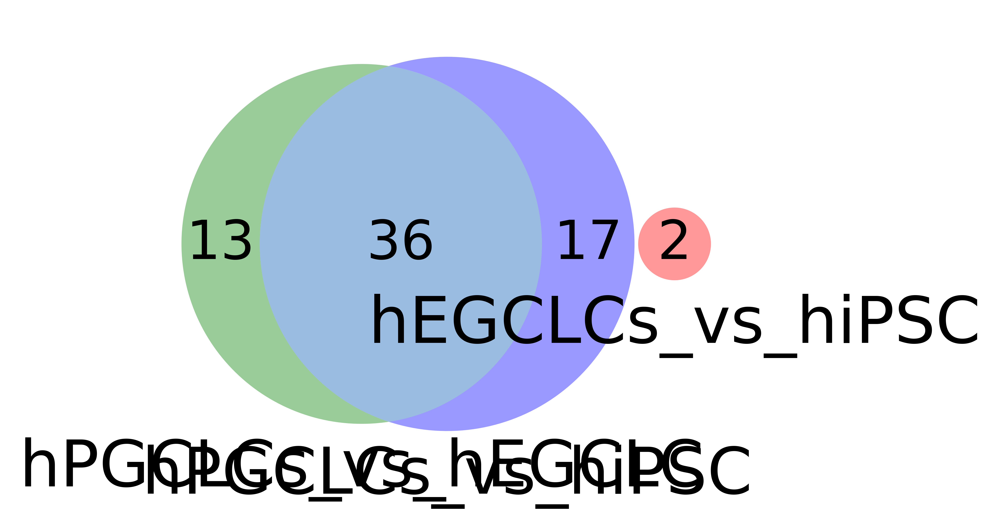

In [79]:
_ = venn3([set(egVSipsc_down['GO.ID']), set(pgcVSeg_down['GO.ID']), set(pgcVSipsc_down['GO.ID'])], set_labels=('hEGCLCs_vs_hiPSC', 'hPGCLCs_vs_hEGCLC', 'hPGCLCs_vs_hiPSC'))

In [80]:
set(pgcVSeg_down['Term']).intersection(set(pgcVSipsc_down['Term'])).intersection(set(egVSipsc_down['Term']))

set()

In [81]:
set(pgcVSeg_down['Term']).intersection(set(pgcVSipsc_down['Term']))

{'CoA-ligase activity',
 'G protein-coupled peptide receptor activ...',
 'G protein-coupled receptor activity',
 'G-protein beta-subunit binding',
 'Wnt-protein binding',
 'alkali metal ion binding',
 'amyloid-beta binding',
 'antigen binding',
 'calcium channel regulator activity',
 'calcium-dependent phospholipid binding',
 'chloride channel activity',
 'cytokine activity',
 'cytokine receptor activity',
 'excitatory extracellular ligand-gated io...',
 'extracellular matrix binding',
 'extracellular matrix structural constitu...',
 'fibroblast growth factor receptor bindin...',
 'glutamate receptor activity',
 'growth factor activity',
 'hormone activity',
 'inward rectifier potassium channel activ...',
 'ligand-gated cation channel activity',
 'neuropeptide receptor activity',
 'neuropeptide receptor binding',
 'organic acid:sodium symporter activity',
 'peptide hormone binding',
 'phosphatidylserine binding',
 'protein tyrosine kinase activator activi...',
 'proteoglycan binding',


In [82]:
pgcVSeg_down= pgcVSeg_down[~pgcVSeg_down.index.duplicated()]
pgcVSipsc_down= pgcVSipsc_down[~pgcVSipsc_down.index.duplicated()]

In [83]:
intersection = set(pgcVSeg_down['Term']).intersection(set(pgcVSipsc_down['Term']))
df = pd.DataFrame(index = intersection)

df['Scores_pgcVSeg_up'] = pgcVSeg_down[pgcVSeg_down.Term.isin(intersection)]['Statistics']
df['Scores_pgcVSipsc_up'] = pgcVSipsc_down[pgcVSipsc_down.Term.isin(intersection)]['Statistics']
df['Combined'] = df['Scores_pgcVSeg_up'] * df['Scores_pgcVSipsc_up']

In [84]:
intTable(df.sort_values(by = 'Combined'), save = False)

Column
    [0] Tabulator(page_size=10, pagination='remote', value=              ...)

In [85]:
set(egVSipsc_down['Term']).intersection(set(pgcVSipsc_down['Term']))

set()

In [86]:
intersection = set(egVSipsc_down['Term']).intersection(set(pgcVSipsc_down['Term']))
df = pd.DataFrame(index = intersection)
egVSipsc_down.index = egVSipsc_down.Term
pgcVSipsc_down.index = pgcVSipsc_down.Term
df['Scores_egVSipsc_down'] = egVSipsc_down[egVSipsc_down.Term.isin(intersection)]['Statistics']
df['Scores_pgcVSipsc_down'] = pgcVSipsc_down[pgcVSipsc_down.Term.isin(intersection)]['Statistics']
df['Combined'] = df['Scores_egVSipsc_down'] * df['Scores_pgcVSipsc_down']

In [87]:
intTable(df.sort_values(by = 'Combined'), save = False)

Column
    [0] Tabulator(page_size=10, pagination='remote', value=Empty DataFrame
Columns: [...)

## Terms enriched in all genes 

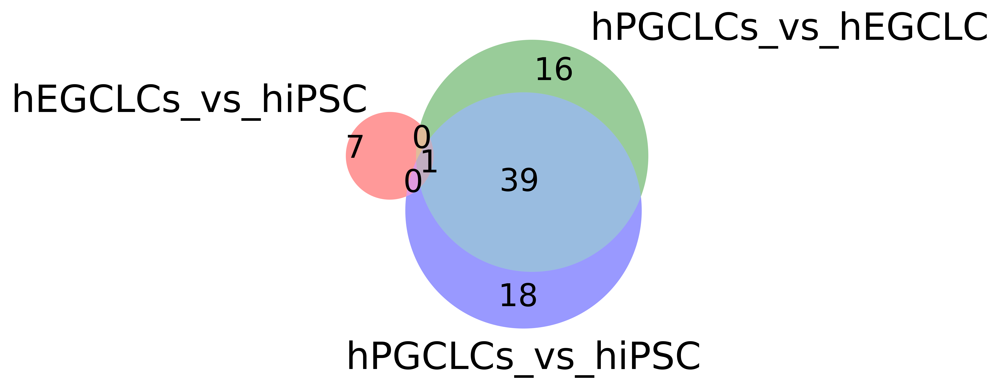

In [88]:
_ = venn3([set(egVSipsc_all['GO.ID']), set(pgcVSeg_all['GO.ID']), set(pgcVSipsc_all['GO.ID'])], set_labels=('hEGCLCs_vs_hiPSC', 'hPGCLCs_vs_hEGCLC', 'hPGCLCs_vs_hiPSC'))

In [89]:
set(pgcVSeg_all['Term']).intersection(set(pgcVSipsc_all['Term'])).intersection(set(egVSipsc_all['Term']))

{'G protein-coupled receptor activity'}

In [90]:
set(pgcVSeg_all['Term']).intersection(set(pgcVSipsc_all['Term']))

{'G protein-coupled peptide receptor activ...',
 'G protein-coupled receptor activity',
 'G-protein beta-subunit binding',
 'Wnt-protein binding',
 'antigen binding',
 'calcium channel regulator activity',
 'chloride channel activity',
 'cholesterol binding',
 'cytokine activity',
 'cytokine binding',
 'cytokine receptor activity',
 'delayed rectifier potassium channel acti...',
 'excitatory extracellular ligand-gated io...',
 'extracellular matrix binding',
 'extracellular matrix structural constitu...',
 'fibroblast growth factor receptor bindin...',
 'fibronectin binding',
 'frizzled binding',
 'glutamate receptor activity',
 'growth factor activity',
 'growth factor receptor binding',
 'heparin binding',
 'hormone activity',
 'inward rectifier potassium channel activ...',
 'ligand-gated cation channel activity',
 'neuropeptide receptor activity',
 'neuropeptide receptor binding',
 'organic acid:sodium symporter activity',
 'outward rectifier potassium channel acti...',
 'peptide ho

In [91]:
set(egVSipsc_all['Term']).intersection(set(pgcVSipsc_all['Term']))

{'G protein-coupled receptor activity'}

## GO CC

In [92]:
egVSipsc_up = pd.read_excel(tables_folder + 'GO_upregulated_hEGCLCs_vs_hiPSC_CC.xlsx', index_col = 0)
pgcVSeg_up = pd.read_excel(tables_folder + 'GO_upregulated_hPGCLCs_vs_EGCLC_CC.xlsx', index_col = 0)
pgcVSipsc_up = pd.read_excel(tables_folder + 'GO_upregulated_hPGCLCs_vs_hiPSC_CC.xlsx', index_col = 0)

In [93]:
egVSipsc_down = pd.read_excel(tables_folder + 'GO_downregulated_hEGCLCs_vs_hiPSC_CC.xlsx', index_col = 0)
pgcVSeg_down = pd.read_excel(tables_folder + 'GO_downregulated_hPGCLCs_vs_EGCLC_CC.xlsx', index_col = 0)
pgcVSipsc_down = pd.read_excel(tables_folder + 'GO_downregulated_hPGCLCs_vs_hiPSC_CC.xlsx', index_col = 0)

In [94]:
#egVSipsc_all = pd.read_excel(tables_folder + 'GO_allSignificant_hEGCLCs_vs_hiPSC_CC.xlsx', index_col = 0)
#pgcVSeg_all = pd.read_excel(tables_folder + 'GO_allSignificant_hPGCLCs_vs_EGCLC_CC.xlsx', index_col = 0)
#pgcVSipsc_all = pd.read_excel(tables_folder + 'GO_allSignificant_hPGCLCs_vs_hiPSC_CC.xlsx', index_col = 0)

In [95]:
len(egVSipsc_up)

6

In [96]:
len(pgcVSeg_up)

15

In [97]:
len(pgcVSipsc_up)

15

# Venn diagrams
## Terms enriched in upregulated genes 

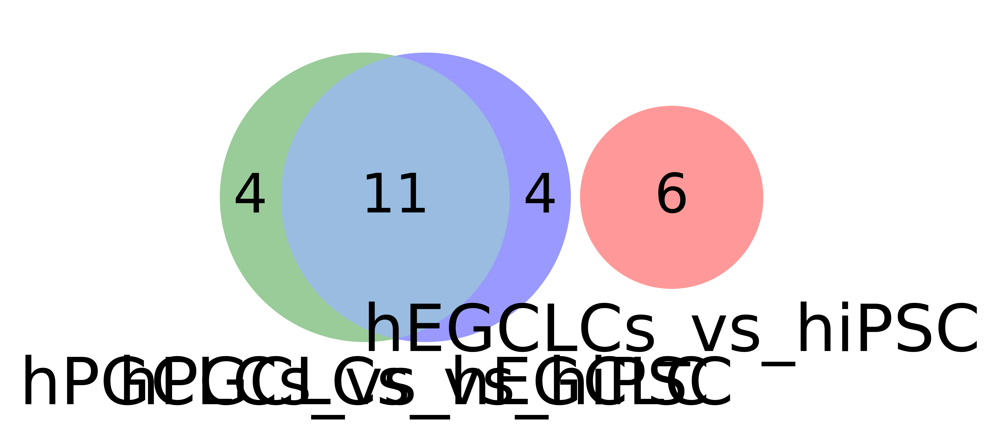

In [98]:
_ = venn3([set(egVSipsc_up['GO.ID']), set(pgcVSeg_up['GO.ID']), set(pgcVSipsc_up['GO.ID'])], set_labels=('hEGCLCs_vs_hiPSC', 'hPGCLCs_vs_hEGCLC', 'hPGCLCs_vs_hiPSC'))

In [99]:
intersection = set(pgcVSeg_up['Term']).intersection(set(pgcVSipsc_up['Term']))
df = pd.DataFrame(index = intersection)
pgcVSeg_up.index = pgcVSeg_up.Term
pgcVSipsc_up.index = pgcVSipsc_up.Term
df['Scores_pgcVSeg_up'] = pgcVSeg_up[pgcVSeg_up.Term.isin(intersection)]['Statistics']
df['Scores_pgcVSipsc_up'] = pgcVSipsc_up[pgcVSipsc_up.Term.isin(intersection)]['Statistics']
df['Combined'] = df['Scores_pgcVSeg_up'] * df['Scores_pgcVSipsc_up']

In [100]:
df.sort_values(by = 'Combined').head(10)

,Scores_pgcVSeg_up,Scores_pgcVSipsc_up,Combined
external side of plasma membrane,1.600000e-07,5.300000e-07,8.480000e-14
collagen-containing extracellular matrix,4.900000e-05,2.400000e-05,1.176000e-09
intermediate filament,2.600000e-04,1.700000e-05,4.420000e-09
extracellular matrix,1.100000e-05,3.680000e-03,4.048000e-08
basal plasma membrane,1.000000e-04,4.800000e-04,4.800000e-08
blood microparticle,3.660000e-03,3.800000e-04,1.390800e-06
brush border membrane,1.299000e-02,9.300000e-03,1.208070e-04
Golgi lumen,1.688000e-02,7.920000e-03,1.336896e-04
collagen trimer,1.083000e-02,1.994000e-02,2.159502e-04
desmosome,4.764000e-02,6.440000e-03,3.068016e-04


In [101]:
set(egVSipsc_up['Term']).intersection(set(pgcVSipsc_up['Term']))

set()

## Terms enriched in downregulated genes 

/usr/local/lib/python3.8/dist-packages/matplotlib_venn/_venn3.py:53: UserWarning:

Circle A has zero area



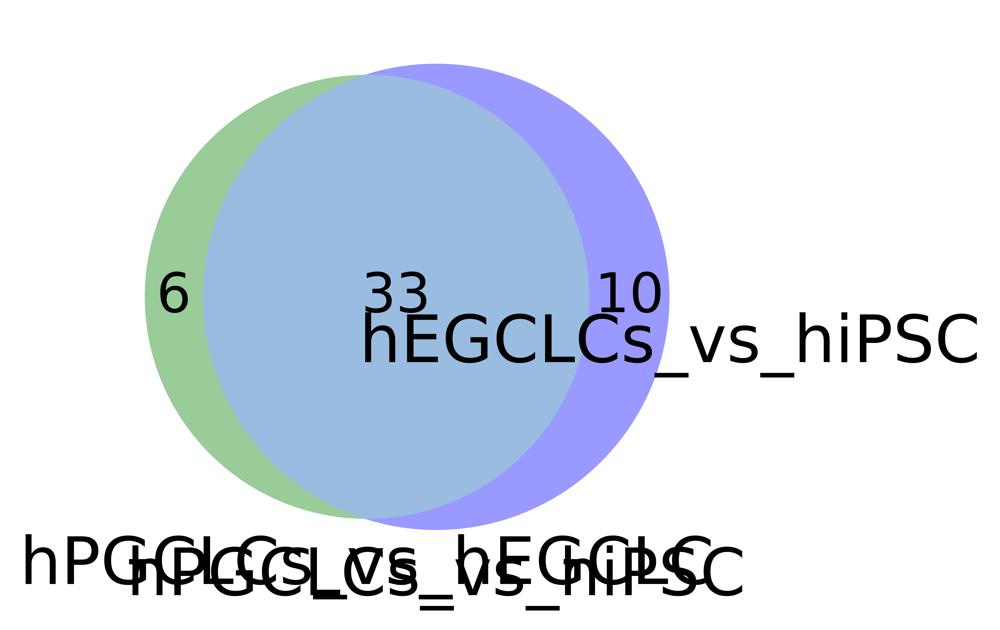

In [102]:
_ = venn3([set(egVSipsc_down['GO.ID']), set(pgcVSeg_down['GO.ID']), set(pgcVSipsc_down['GO.ID'])], set_labels=('hEGCLCs_vs_hiPSC', 'hPGCLCs_vs_hEGCLC', 'hPGCLCs_vs_hiPSC'))

In [103]:
set(pgcVSeg_down['Term']).intersection(set(pgcVSipsc_down['Term'])).intersection(set(egVSipsc_down['Term']))

set()

In [104]:
egVSipsc_down

,GO.ID,Term,Annotated,Significant,Expected,Statistics,ER,-log10(pvalue),Significant/Annotated


In [105]:
set(pgcVSeg_down['Term']).intersection(set(pgcVSipsc_down['Term']))

{'AMPA glutamate receptor complex',
 'GABA-ergic synapse',
 'Golgi lumen',
 'T-tubule',
 'acrosomal membrane',
 'anchored component of membrane',
 'anchored component of plasma membrane',
 'axon terminus',
 'cation channel complex',
 'chloride channel complex',
 'collagen trimer',
 'dendrite membrane',
 'dendritic spine',
 'dense core granule',
 'excitatory synapse',
 'external side of plasma membrane',
 'extracellular matrix',
 'glial cell projection',
 'hippocampal mossy fiber to CA3 synapse',
 'inhibitory synapse',
 'integral component of postsynaptic densi...',
 'integral component of postsynaptic speci...',
 'integral component of presynaptic membra...',
 'integral component of synaptic vesicle m...',
 'intrinsic component of synaptic vesicle ...',
 'ionotropic glutamate receptor complex',
 'plasma membrane signaling receptor compl...',
 'postsynaptic density membrane',
 'postsynaptic membrane',
 'receptor complex',
 'sarcoplasmic reticulum membrane',
 'sodium channel complex',
 '

In [106]:
intersection = set(pgcVSeg_down['Term']).intersection(set(pgcVSipsc_down['Term']))
df = pd.DataFrame(index = intersection)
pgcVSeg_down.index = pgcVSeg_down.Term
pgcVSipsc_down.index = pgcVSipsc_down.Term
df['Scores_pgcVSeg_up'] = pgcVSeg_down[pgcVSeg_down.Term.isin(intersection)]['Statistics']
df['Scores_pgcVSipsc_up'] = pgcVSipsc_down[pgcVSipsc_down.Term.isin(intersection)]['Statistics']
df['Combined'] = df['Scores_pgcVSeg_up'] * df['Scores_pgcVSipsc_up']

In [107]:
intTable(df.sort_values(by = 'Combined'), save = False)

Column
    [0] Tabulator(page_size=10, pagination='remote', value=              ...)

In [108]:
set(egVSipsc_down['Term']).intersection(set(pgcVSipsc_down['Term']))

set()

## Reactome

In [109]:
egVSipsc_up = pd.read_excel(tables_folder + 'GO_up_hEGCLCs_vs_hiPSC_reactome.xlsx', index_col = 0)
pgcVSeg_up = pd.read_excel(tables_folder + 'GO_up_hPGCLCs_vs_EGCLC_reactome.xlsx', index_col = 0)
pgcVSipsc_up = pd.read_excel(tables_folder + 'GO_up_hPGCLCs_vs_hiPSC_reactome.xlsx', index_col = 0)

In [110]:
egVSipsc_down = pd.read_excel(tables_folder + 'GO_down_hEGCLCs_vs_hiPSC_reactome.xlsx', index_col = 0)
pgcVSeg_down = pd.read_excel(tables_folder + 'GO_down_hPGCLCs_vs_EGCLC_reactome.xlsx', index_col = 0)
pgcVSipsc_down = pd.read_excel(tables_folder + 'GO_down_hPGCLCs_vs_hiPSC_reactome.xlsx', index_col = 0)

In [111]:
egVSipsc_all = pd.read_excel(tables_folder + 'GO_all_hEGCLCs_vs_hiPSC_reactome.xlsx', index_col = 0)
pgcVSeg_all = pd.read_excel(tables_folder + 'GO_all_hPGCLCs_vs_EGCLC_reactome.xlsx', index_col = 0)
pgcVSipsc_all = pd.read_excel(tables_folder + 'GO_all_hPGCLCs_vs_hiPSC_reactome.xlsx', index_col = 0)

In [112]:
#egVSipsc_up

# Venn diagrams
## Terms enriched in upregulated genes 

In [113]:
pgcVSipsc_up

,estimate,pvals,log10_pval,gene_annotated,n_gene_annotated,gene_significant,n_gene_significant,ER,genes_score
source,,,,,,,,,
REACTOME_GPCR_LIGAND_BINDING,inf,0.000000e+00,inf,"['GPR183', 'CCL2', 'CXCL3', 'CXCL10', 'CXCL6',...",463,"['GCGR', 'WNT2B', 'TRH', 'APLNR', 'NMUR1', 'PT...",38,0.082073,"[39.49588643299154, 33.297928178377134, 40.062..."
REACTOME_EXTRACELLULAR_MATRIX_ORGANIZATION,42.519016,3.026805e-43,42.519016,"['BMP2', 'ICAM1', 'TNC', 'SDC4', 'SERPINE1', '...",300,"['HAPLN1', 'COL23A1', 'PLOD1', 'DMD', 'CTSL', ...",32,0.106667,"[65.7986538088462, 103.36318933859657, 69.0811..."
REACTOME_RHO_GTPASE_CYCLE,34.512749,3.070788e-35,34.512749,"['JAG1', 'TRIP10', 'RHOB', 'CAVIN1', 'AKAP12',...",450,"['ARMCX3', 'PCDH7', 'ACTC1', 'DIAPH2', 'DSP', ...",26,0.057778,"[54.70057406879335, 13.91909396274346, 84.6465..."
REACTOME_SIGNALING_BY_INTERLEUKINS,33.179810,6.609813e-34,33.179810,"['RIPK2', 'CCL2', 'MAP3K8', 'VEGFA', 'DUSP4', ...",461,"['IL4R', 'CSF3R', 'JUNB', 'NLRC5', 'NFKB2', 'F...",25,0.054230,"[23.204773309513616, 81.91921767972629, 6.9696..."
REACTOME_NEUTROPHIL_DEGRANULATION,33.179810,6.609813e-34,33.179810,"['PTX3', 'PLAU', 'NFKB1', 'SLC2A3', 'CXCL1', '...",478,"['FUCA1', 'DSP', 'CAMP', 'BST1', 'HGSNAT', 'AG...",25,0.052301,"[39.4499262012086, 39.92293469792166, 27.98103..."
...,...,...,...,...,...,...,...,...,...
REACTOME_REGULATION_OF_TP53_ACTIVITY,6.614033,2.432021e-07,6.614033,"['SGK1', 'TP53INP1', 'AURKA', 'CDK1', 'TPX2', ...",160,"['CHD3', 'PRDM1', 'POU4F1', 'SGK1', 'SMYD2']",5,0.031250,"[142.44874207108666, 30.476909844062614, 20.59..."
REACTOME_DISORDERS_OF_TRANSMEMBRANE_TRANSPORTERS,6.614033,2.432021e-07,6.614033,"['ABCA1', 'SLC2A1', 'CP', 'HK1', 'GCK', 'AVPR1...",177,"['GCKR', 'SLC2A9', 'SLCO2A1', 'ABCA1', 'SLC6A2']",5,0.028249,"[19.426605437676702, 29.234868870075427, 24.49..."
REACTOME_CILIUM_ASSEMBLY,6.614033,2.432021e-07,6.614033,"['TUBB2A', 'KIF3B', 'TUBA4A', 'DYNLL2', 'HDAC6...",202,"['KIF3A', 'PRKAR2B', 'CYS1', 'IFT172', 'KIFAP3']",5,0.024752,"[38.279452481075246, 90.7403994556073, 28.8877..."


/usr/local/lib/python3.8/dist-packages/matplotlib_venn/_venn3.py:53: UserWarning:

Circle A has zero area



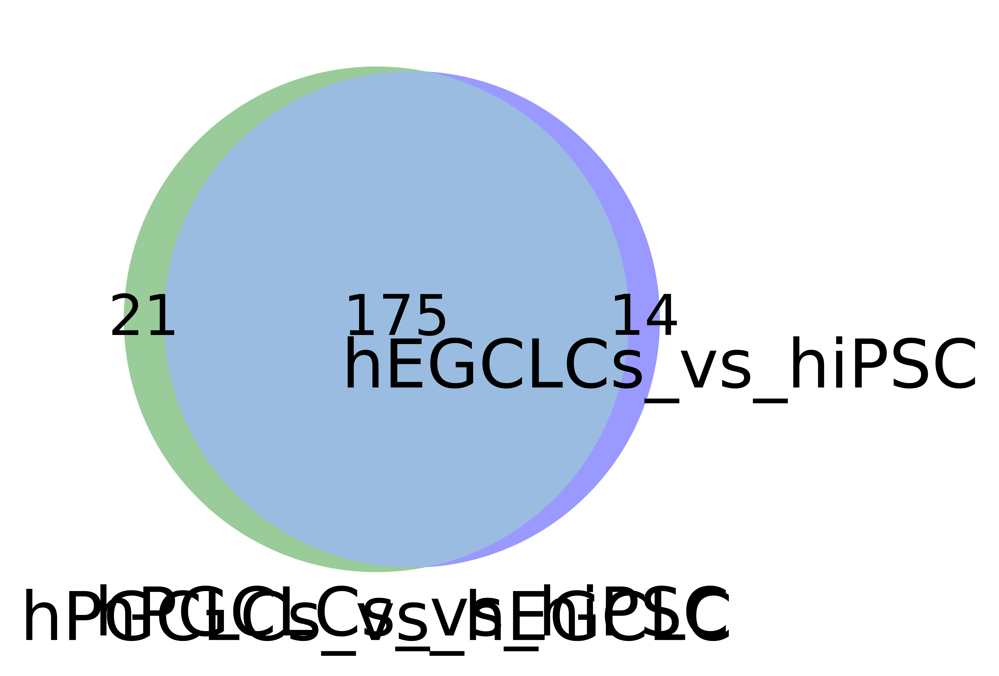

In [114]:
_ = venn3([set(), set(pgcVSeg_up.index.tolist()), set(pgcVSipsc_up.index.tolist())], set_labels=('hEGCLCs_vs_hiPSC', 'hPGCLCs_vs_hEGCLC', 'hPGCLCs_vs_hiPSC'))

In [115]:
intersection = set(pgcVSeg_up.index).intersection(set(pgcVSipsc_up.index))
df = pd.DataFrame(index = intersection)
pgcVSeg_up.index = pgcVSeg_up.index
pgcVSipsc_up.index = pgcVSipsc_up.index
df['Scores_pgcVSeg_up'] = pgcVSeg_up[pgcVSeg_up.index.isin(intersection)]['pvals']
df['Scores_pgcVSipsc_up'] = pgcVSipsc_up[pgcVSipsc_up.index.isin(intersection)]['pvals']
df['Combined'] = df['Scores_pgcVSeg_up'] * df['Scores_pgcVSipsc_up']

In [116]:
intTable(df.sort_values(by = 'Combined'), save = False)

Column
    [0] Tabulator(page_size=10, pagination='remote', value=              ...)

In [117]:
set(egVSipsc_up.index).intersection(set(pgcVSipsc_up.index))

set()

## Terms enriched in downregulated genes 

/usr/local/lib/python3.8/dist-packages/matplotlib_venn/_venn3.py:53: UserWarning:

Circle A has zero area



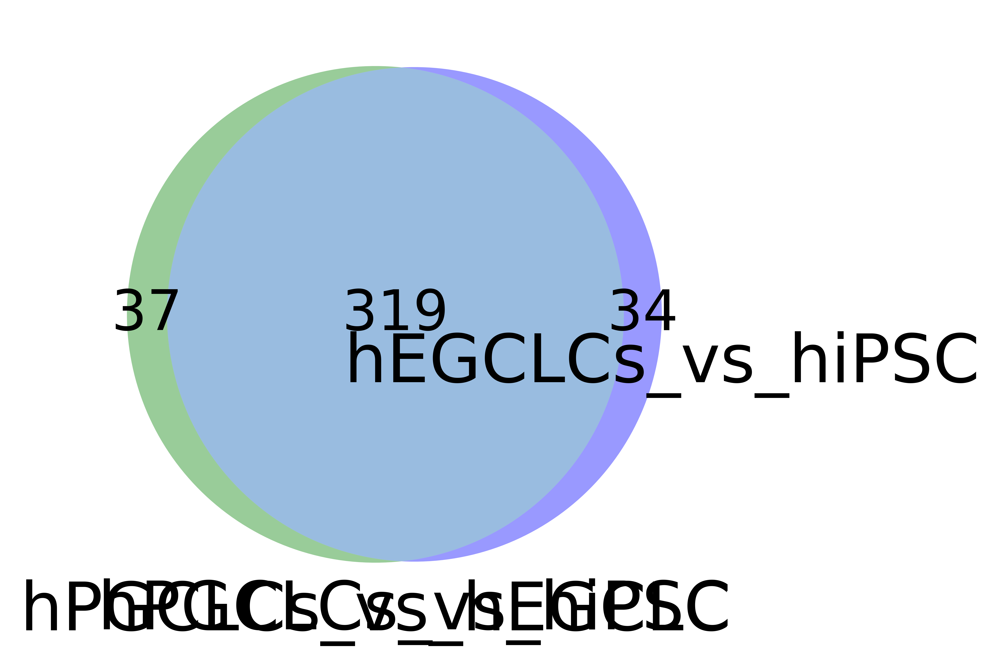

In [118]:
_ = venn3([set(), set(pgcVSeg_down.index), set(pgcVSipsc_down.index)], set_labels=('hEGCLCs_vs_hiPSC', 'hPGCLCs_vs_hEGCLC', 'hPGCLCs_vs_hiPSC'))

In [119]:
set(pgcVSeg_down.index).intersection(set(pgcVSipsc_down.index)).intersection(set(egVSipsc_down.index))

set()

In [120]:
#set(pgcVSeg_down['source']).intersection(set(pgcVSipsc_down['source']))